In [1]:
from google.colab import drive
drive.mount('/content/drive', force_remount=True)

Mounted at /content/drive


In [1]:
%cd /content/drive/MyDrive/Udacity/Face_Generation

/content/drive/.shortcut-targets-by-id/1EVtctRXwRyXTh-m7wXGbLvVPlAu5qxk4/Udacity/Face_Generation


# Face Generation

In this project, you'll define and train a Generative Adverserial network of your own creation on a dataset of faces. Your goal is to get a generator network to generate *new* images of faces that look as realistic as possible!

The project will be broken down into a series of tasks from **defining new architectures training adversarial networks**. At the end of the notebook, you'll be able to visualize the results of your trained Generator to see how it performs; your generated samples should look like fairly realistic faces with small amounts of noise.

### Get the Data

You'll be using the [CelebFaces Attributes Dataset (CelebA)](http://mmlab.ie.cuhk.edu.hk/projects/CelebA.html) to train your adversarial networks.

This dataset has higher resolution images than datasets you have previously worked with (like MNIST or SVHN) you've been working with, and so, you should prepare to define deeper networks and train them for a longer time to get good results. It is suggested that you utilize a GPU for training.

### Pre-processed Data

Since the project's main focus is on building the GANs, we've done *some* of the pre-processing for you. Each of the CelebA images has been cropped to remove parts of the image that don't include a face, then resized down to 64x64x3 NumPy images. Some sample data is show below.

<img src='assets/processed_face_data.png' width=60% />

> If you are working locally, you can download this data [by clicking here](https://s3.amazonaws.com/video.udacity-data.com/topher/2018/November/5be7eb6f_processed-celeba-small/processed-celeba-small.zip)

This is a zip file that you'll need to extract in the home directory of this notebook for further loading and processing. After extracting the data, you should be left with a directory of data `processed-celeba-small/`.

In [ ]:
# run this once to unzip the file
!unzip processed-celeba-small.zip

In [29]:
from glob import glob
from typing import Tuple, Callable, Dict

import matplotlib.pyplot as plt
import numpy as np
import torch
from PIL import Image
from torch.utils.data import DataLoader, Dataset
from torchvision.transforms import Compose, ToTensor, Resize, Normalize

import tests
import os

In [3]:
data_dir = 'processed_celeba_small/celeba/'

In [5]:
# check on training device
train_on_gpu = torch.cuda.is_available()

## Data pipeline

The [CelebA](http://mmlab.ie.cuhk.edu.hk/projects/CelebA.html) dataset contains over 200,000 celebrity images with annotations. Since you're going to be generating faces, you won't need the annotations, you'll only need the images. Note that these are color images with [3 color channels (RGB)](https://en.wikipedia.org/wiki/Channel_(digital_image)#RGB_Images) each.

### Pre-process and Load the Data

Since the project's main focus is on building the GANs, we've done *some* of the pre-processing for you. Each of the CelebA images has been cropped to remove parts of the image that don't include a face, then resized down to 64x64x3 NumPy images. This *pre-processed* dataset is a smaller subset of the very large CelebA dataset and contains roughly 30,000 images.

Your first task consists in building the dataloader. To do so, you need to do the following:
* implement the get_transforms function
* create a custom Dataset class that reads the CelebA data

### Exercise: implement the get_transforms function

The `get_transforms` function should output a [`torchvision.transforms.Compose`](https://pytorch.org/vision/stable/generated/torchvision.transforms.Compose.html#torchvision.transforms.Compose) of different transformations. You have two constraints:
* the function takes a tuple of size as input and should **resize the images** to the input size
* the output images should have values **ranging from -1 to 1**

In [6]:
def get_transforms(size: Tuple[int, int]) -> Callable:
    """ Transforms to apply to the image."""
    # TODO: edit this function by appening transforms to the below list

    transforms = [
        Resize(size),
        ToTensor(),
        Normalize([0.5, 0.5, 0.5], [0.5, 0.5, 0.5])
    ]


    return Compose(transforms)

### Exercise: implement the DatasetDirectory class


The `DatasetDirectory` class is a torch Dataset that reads from the above data directory. The `__getitem__` method should output a transformed tensor and the `__len__` method should output the number of files in our dataset. You can look at [this custom dataset](https://pytorch.org/tutorials/beginner/basics/data_tutorial.html#creating-a-custom-dataset-for-your-files) for ideas.

In [30]:
class DatasetDirectory(Dataset):
    """
    A custom dataset class that loads images from a folder.
    Args:
    - directory: location of the images
    - transform: transform function to apply to the images
    - extension: file format
    """
    def __init__(self,
                 directory: str,
                 transforms: Callable = None,
                 extension: str = '.jpg'):
        """
        Initialize the DatasetDirectory class.
        Args:
        - directory: The directory containing the images.
        - transforms: Transformations to apply to the images (e.g., resizing, normalizing).
        - extension: The file extension of the images (e.g., '.jpg', '.png').
        """
        self.directory = directory
        self.transforms = transforms
        self.extension = extension

        # Get a list of all image file paths in the directory
        self.image_paths = [os.path.join(directory, filename)
                            for filename in os.listdir(directory)
                            if filename.endswith(extension)]

    def __len__(self) -> int:
        """
        Returns the number of items in the dataset.
        """
        return len(self.image_paths)

    def __getitem__(self, index: int) -> torch.Tensor:
        """
        Load an image and apply transformations.
        Args:
        - index: The index of the item to retrieve.
        Returns:
        - image: The loaded and transformed image as a torch.Tensor.
        """
        # Load the image from the file path
        image_path = self.image_paths[index]
        image = Image.open(image_path)
        if self.transforms:
            image = self.transforms(image)

        return image

In [31]:
"""
DO NOT MODIFY ANYTHING IN THIS CELL
"""
# run this cell to verify your dataset implementation
dataset = DatasetDirectory(data_dir, get_transforms((64, 64)))
tests.check_dataset_outputs(dataset)

Congrats, your dataset implementation passed all the tests


The functions below will help you visualize images from the dataset.

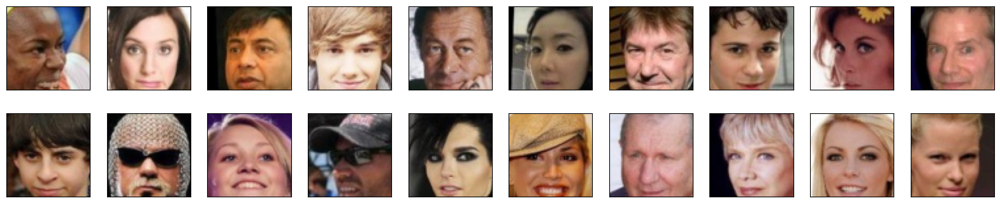

In [9]:
"""
DO NOT MODIFY ANYTHING IN THIS CELL
"""

def denormalize(images):
    """Transform images from [-1.0, 1.0] to [0, 255] and cast them to uint8."""
    return ((images + 1.) / 2. * 255).astype(np.uint8)

# plot the images in the batch, along with the corresponding labels
fig = plt.figure(figsize=(20, 4))
plot_size=20
for idx in np.arange(plot_size):
    ax = fig.add_subplot(2, int(plot_size/2), idx+1, xticks=[], yticks=[])
    img = dataset[idx].numpy()
    img = np.transpose(img, (1, 2, 0))
    img = denormalize(img)
    ax.imshow(img)

## Model implementation

As you know, a GAN is comprised of two adversarial networks, a discriminator and a generator. Now that we have a working data pipeline, we need to implement the discriminator and the generator.

Feel free to implement any additional class or function.

### Exercise: Create the discriminator

The discriminator's job is to score real and fake images. You have two constraints here:
* the discriminator takes as input a **batch of 64x64x3 images**
* the output should be a single value (=score)

Feel free to get inspiration from the different architectures we talked about in the course, such as DCGAN, WGAN-GP or DRAGAN.

#### Some tips
* To scale down from the input image, you can either use `Conv2d` layers with the correct hyperparameters or Pooling layers.
* If you plan on using gradient penalty, do not use Batch Normalization layers in the discriminator.

In [10]:
import torch.nn as nn
import torch.nn.functional as F

In [11]:
class ConvBlock(nn.Module):
    def __init__(self, in_channels: int, out_channels: int, kernel_size: int, batch_norm: bool = True, value_activation: int = 0.2):
        super(ConvBlock, self).__init__()

        self.conv = nn.Conv2d(in_channels, out_channels, kernel_size, stride=2, padding=1, bias=False)
        self.batch_norm = batch_norm
        if self.batch_norm:
            self.bn = nn.BatchNorm2d(out_channels)
        self.activation = nn.LeakyReLU(value_activation)

    def forward(self, x: torch.Tensor) -> torch.Tensor:
        x = self.conv(x)
        if self.batch_norm:
            x = self.bn(x)
        x = self.activation(x)
        return x

In [12]:
class Discriminator(nn.Module):
    def __init__(self, conv_dim: int=32):
        super(Discriminator, self).__init__()
        # TODO: instantiate the different layers

        self.conv_dim = conv_dim
        self.kernel_size = 4
        self.size_input = 64
        self.num_layer = 0

        self.conv1= ConvBlock(3, self.conv_dim, self.kernel_size, batch_norm=False)
        self.num_layer = self.num_layer + 1
        self.conv2= ConvBlock(self.conv_dim, self.conv_dim*2, self.kernel_size)
        self.num_layer = self.num_layer + 1
        self.conv3= ConvBlock(self.conv_dim*2, self.conv_dim*4, self.kernel_size)
        self.num_layer = self.num_layer + 1
        self.conv4= ConvBlock(self.conv_dim*4, self.conv_dim*8, self.kernel_size)
        self.num_layer = self.num_layer + 1

        self.final_size = int(self.size_input / (2**self.num_layer))

        self.flatten = nn.Flatten()
        self.fc1 = nn.Linear(self.conv_dim*8*self.final_size*self.final_size, self.conv_dim*4)
        self.fc2 = nn.Linear(self.conv_dim*4, 1)
    def forward(self, x: torch.Tensor) -> torch.Tensor:
        # TODO: implement the forward method
        x= self.conv1(x)
        x= self.conv2(x)
        x= self.conv3(x)
        x= self.conv4(x)

        x = self.flatten(x)
        x = self.fc1(x)
        x = self.fc2(x)
#         print(x.shape)
        x = x.unsqueeze(2)
#         print(x.shape)
        x = x.unsqueeze(3)
#         print(x.shape)
        return x

In [13]:
"""
DO NOT MODIFY ANYTHING IN THIS CELL
"""
# run this cell to check your discriminator implementation
discriminator = Discriminator()
tests.check_discriminator(discriminator)

Congrats, your discriminator implementation passed all the tests


### Exercise: create the generator

The generator's job creates the "fake images" and learns the dataset distribution. You have three constraints here:
* the generator takes as input a vector of dimension `[batch_size, latent_dimension, 1, 1]`
* the generator must outputs **64x64x3 images**

Feel free to get inspiration from the different architectures we talked about in the course, such as DCGAN, WGAN-GP or DRAGAN.

#### Some tips:
* to scale up from the latent vector input, you can use `ConvTranspose2d` layers
* as often with Gan, **Batch Normalization** helps with training

In [14]:
class DeconvBlock(nn.Module):
    def __init__(self, in_channels: int, out_channels: int, kernel_size: int, stride: int, padding: int, batch_norm: bool = True):
        super(DeconvBlock, self).__init__()
        self.devcon = nn.ConvTranspose2d(in_channels, out_channels, kernel_size, stride, padding, bias= False)
        self.batch_norm = batch_norm
        if self.batch_norm:
            self.bn = nn.BatchNorm2d(out_channels)
        self.activation = nn.ReLU()

    def forward(self, x: torch.Tensor) -> torch.Tensor:
        x = self.devcon(x)
        if self.batch_norm:
            x = self.bn(x)
        x = self.activation(x)

        return x

In [15]:
class Generator(nn.Module):
    def __init__(self, latent_dim: int, conv_dim: int = 32):
        super(Generator, self).__init__()
        # TODO: instantiate the different layers
        self.conv_dim = conv_dim
        self.deconv1 = DeconvBlock(latent_dim, self.conv_dim*8, 4, stride=1, padding=0)
        self.deconv2 = DeconvBlock(self.conv_dim*8, self.conv_dim*4, 4, stride=2, padding=1)
        self.deconv3 = DeconvBlock(self.conv_dim*4, self.conv_dim*2, 4, stride=2, padding=1)
        self.deconv4 = DeconvBlock(self.conv_dim*2, self.conv_dim, 4, stride=2, padding=1)
        self.deconv5 = nn.ConvTranspose2d(conv_dim, 3, 4, stride=2, padding=1)
        self.last_activation = nn.Tanh()

    def forward(self, x: torch.Tensor) -> torch.Tensor:
        # TODO: implement the forward method
        x = self.deconv1(x)
        x = self.deconv2(x)
        x = self.deconv3(x)
        x = self.deconv4(x)
        x = self.deconv5(x)
        x = self.last_activation(x)

        return x

In [16]:
"""
DO NOT MODIFY ANYTHING IN THIS CELL
"""
# run this cell to verify your generator implementation
latent_dim = 128
generator = Generator(latent_dim)
tests.check_generator(generator, latent_dim)

Congrats, your generator implementation passed all the tests


## Optimizer

In the following section, we create the optimizers for the generator and discriminator. You may want to experiment with different optimizers, learning rates and other hyperparameters as they tend to impact the output quality.

### Exercise: implement the optimizers

In [17]:
import torch.optim as optim


def create_optimizers(generator: nn.Module, discriminator: nn.Module):
    """ This function should return the optimizers of the generator and the discriminator """
    # TODO: implement the generator and discriminator optimizers
    lr = 0.0002
    beta1=0.5
    beta2=0.999

    g_optimizer = optim.Adam(generator.parameters(), lr, [beta1, beta2])
    d_optimizer = optim.Adam(discriminator.parameters(), lr, [beta1, beta2])
    return g_optimizer, d_optimizer

## Losses implementation

In this section, we are going to implement the loss function for the generator and the discriminator. You can and should experiment with different loss function.

Some tips:
* You can choose the commonly used the binary cross entropy loss or select other losses we have discovered in the course, such as the Wasserstein distance.
* You may want to implement a gradient penalty function as discussed in the course. It is not required and the code will work whether you implement it or not.

### Exercise: implement the generator loss

The generator's goal is to get the discriminator to think its generated images (= "fake" images) are real.

In [18]:
def real_loss(D_out, smooth=False):
    batch_size = D_out.size(0)
    if smooth:
        labels = torch.ones(batch_size)*0.9
    else:
        labels = torch.ones(batch_size)
    if train_on_gpu:
        labels = labels.cuda()
    criterion = nn.BCEWithLogitsLoss()
    loss = criterion(D_out.squeeze(), labels)
    return loss

def fake_loss(D_out):
    batch_size = D_out.size(0)
    labels = torch.zeros(batch_size)
    if train_on_gpu:
        labels = labels.cuda()
    criterion = nn.BCEWithLogitsLoss()
    loss = criterion(D_out.squeeze(), labels)
    return loss

In [19]:
def generator_loss(fake_logits):
    """ Generator loss, takes the fake scores as inputs. """
    # TODO: implement the generator loss
    loss= real_loss(fake_logits, smooth= True)
    return loss

### Exercise: implement the discriminator loss

We want the discriminator to give high scores to real images and low scores to fake ones and the discriminator loss should reflect that.

In [20]:
def discriminator_loss(real_logits, fake_logits):
    """ Discriminator loss, takes the fake and real logits as inputs. """
    # TODO: implement the discriminator loss
    loss= real_loss(real_logits)+ fake_loss(fake_logits)
    return loss

### Exercise (Optional): Implement the gradient Penalty

In the course, we discussed the importance of gradient penalty in training certain types of Gans. Implementing this function is not required and depends on some of the design decision you made (discriminator architecture, loss functions).

In [21]:
def gradient_penalty(discriminator, real_samples, fake_samples):
    """ This function enforces """
    gp = 0
    # TODO (Optional): implement the gradient penalty
    return gp

## Training


Training will involve alternating between training the discriminator and the generator. You'll use your functions real_loss and fake_loss to help you calculate the discriminator losses.

* You should train the discriminator by alternating on real and fake images
* Then the generator, which tries to trick the discriminator and should have an opposing loss function

### Exercise: implement the generator step and the discriminator step functions

Each function should do the following:
* calculate the loss
* backpropagate the gradient
* perform one optimizer step

In [22]:
def generator_step(batch_size: int, latent_dim: int) -> Dict:
    """ One training step of the generator. """
    # TODO: implement the generator step (foward pass, loss calculation and backward pass)
    g_optimizer.zero_grad()

    z= np.random.uniform(-1, 1, size= (batch_size, latent_dim, 1, 1))
    z= torch.from_numpy(z).float()
    if train_on_gpu:
        z= z.cuda()
    fake_img = generator(z)

    d_output = discriminator(fake_img)
    g_loss = generator_loss(d_output)

    g_loss.backward()
    g_optimizer.step()

    return {'loss': g_loss}

def discriminator_step(batch_size: int, latent_dim: int, real_images: torch.Tensor) -> Dict:
    """ One training step of the discriminator. """
    # TODO: implement the discriminator step (foward pass, loss calculation and backward pass)
    gp= None

    d_optimizer.zero_grad()

    # With real image
    if train_on_gpu:
        real_images= real_images.cuda()

    d_real_output= discriminator(real_images)

    # With loss image
    z= np.random.uniform(-1, 1, size= (batch_size, latent_dim, 1, 1))
    z= torch.from_numpy(z).float()
    if train_on_gpu:
        z= z.cuda()
    fake_img= generator(z)

    d_fake_output= discriminator(fake_img)
    d_loss= discriminator_loss(d_real_output, d_fake_output)

    d_loss.backward()
    d_optimizer.step()

    return {'loss': d_loss, 'gp': gp}

### Main training loop

You don't have to implement anything here but you can experiment with different hyperparameters.

In [23]:
from datetime import datetime
import multiprocessing

In [24]:
# you can experiment with different dimensions of latent spaces
latent_dim = 128

# update to cpu if you do not have access to a gpu
device = 'cuda'

# number of epochs to train your model
n_epochs = 20

# number of images in each batch
batch_size = 64

#num_worker
num_workers = multiprocessing.cpu_count()

In [32]:
"""
DO NOT MODIFY ANYTHING IN THIS CELL
"""
print_every = 50

# Create optimizers for the discriminator D and generator G
generator = Generator(latent_dim).to(device)
discriminator = Discriminator().to(device)
g_optimizer, d_optimizer = create_optimizers(generator, discriminator)

dataloader = DataLoader(dataset,
                        batch_size=batch_size,
                        shuffle=True,
                        num_workers=num_workers,
                        drop_last=True,
                        pin_memory=False)

In [26]:
"""
DO NOT MODIFY ANYTHING IN THIS CELL
"""

def display(fixed_latent_vector: torch.Tensor):
    """ helper function to display images during training """
    fig = plt.figure(figsize=(14, 4))
    plot_size = 16
    for idx in np.arange(plot_size):
        ax = fig.add_subplot(2, int(plot_size/2), idx+1, xticks=[], yticks=[])
        img = fixed_latent_vector[idx, ...].detach().cpu().numpy()
        img = np.transpose(img, (1, 2, 0))
        img = denormalize(img)
        ax.imshow(img)
    plt.show()

### Exercise: implement the training strategy

You should experiment with different training strategies. For example:

* train the generator more often than the discriminator.
* added noise to the input image
* use label smoothing

Implement with your training strategy below.

2023-09-09 17:33:29 | Epoch [1/20] | Batch 0/509 | d_loss: 1.3463 | g_loss: 1.1731
2023-09-09 17:33:54 | Epoch [1/20] | Batch 50/509 | d_loss: 0.0949 | g_loss: 19.7093
2023-09-09 17:33:58 | Epoch [1/20] | Batch 100/509 | d_loss: 0.1161 | g_loss: 13.5400
2023-09-09 17:34:03 | Epoch [1/20] | Batch 150/509 | d_loss: 0.0980 | g_loss: 8.9054
2023-09-09 17:34:09 | Epoch [1/20] | Batch 200/509 | d_loss: 4.4972 | g_loss: 12.6749
2023-09-09 17:34:14 | Epoch [1/20] | Batch 250/509 | d_loss: 0.1227 | g_loss: 10.8855
2023-09-09 17:34:19 | Epoch [1/20] | Batch 300/509 | d_loss: 1.0294 | g_loss: 7.3128
2023-09-09 17:34:24 | Epoch [1/20] | Batch 350/509 | d_loss: 0.3307 | g_loss: 3.4046
2023-09-09 17:34:30 | Epoch [1/20] | Batch 400/509 | d_loss: 0.1770 | g_loss: 5.2904
2023-09-09 17:34:36 | Epoch [1/20] | Batch 450/509 | d_loss: 0.9271 | g_loss: 5.0702
2023-09-09 17:34:40 | Epoch [1/20] | Batch 500/509 | d_loss: 0.3537 | g_loss: 1.5721


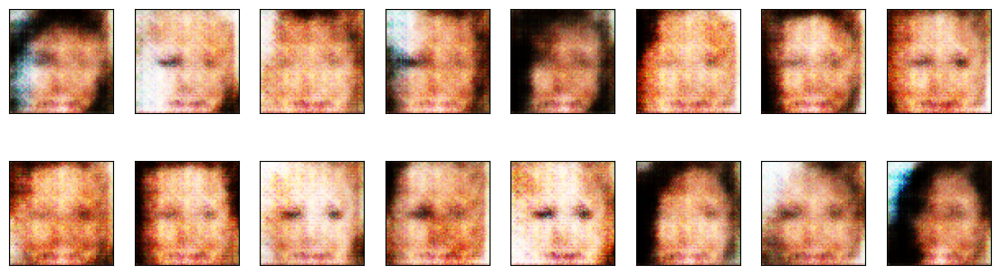

2023-09-09 17:34:42 | Epoch [2/20] | Batch 0/509 | d_loss: 0.3099 | g_loss: 2.8111
2023-09-09 17:34:48 | Epoch [2/20] | Batch 50/509 | d_loss: 0.6488 | g_loss: 6.1151
2023-09-09 17:34:53 | Epoch [2/20] | Batch 100/509 | d_loss: 0.3611 | g_loss: 4.3873
2023-09-09 17:34:57 | Epoch [2/20] | Batch 150/509 | d_loss: 0.4618 | g_loss: 2.4199
2023-09-09 17:35:03 | Epoch [2/20] | Batch 200/509 | d_loss: 0.5140 | g_loss: 4.8419
2023-09-09 17:35:08 | Epoch [2/20] | Batch 250/509 | d_loss: 0.4684 | g_loss: 4.0826
2023-09-09 17:35:12 | Epoch [2/20] | Batch 300/509 | d_loss: 0.2017 | g_loss: 3.4846
2023-09-09 17:35:18 | Epoch [2/20] | Batch 350/509 | d_loss: 1.2955 | g_loss: 10.3625
2023-09-09 17:35:23 | Epoch [2/20] | Batch 400/509 | d_loss: 0.4060 | g_loss: 4.2301
2023-09-09 17:35:28 | Epoch [2/20] | Batch 450/509 | d_loss: 0.3203 | g_loss: 6.0262
2023-09-09 17:35:33 | Epoch [2/20] | Batch 500/509 | d_loss: 1.5002 | g_loss: 0.9035


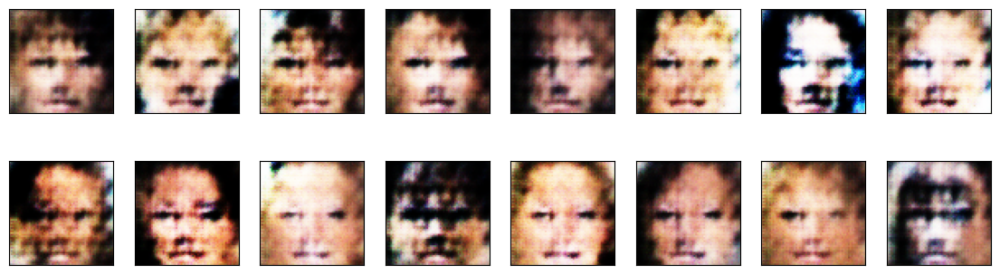

2023-09-09 17:35:35 | Epoch [3/20] | Batch 0/509 | d_loss: 0.6423 | g_loss: 5.1937
2023-09-09 17:35:40 | Epoch [3/20] | Batch 50/509 | d_loss: 0.3577 | g_loss: 5.9391
2023-09-09 17:35:46 | Epoch [3/20] | Batch 100/509 | d_loss: 0.4636 | g_loss: 5.6136
2023-09-09 17:35:50 | Epoch [3/20] | Batch 150/509 | d_loss: 0.2662 | g_loss: 4.7741
2023-09-09 17:35:55 | Epoch [3/20] | Batch 200/509 | d_loss: 0.2345 | g_loss: 5.5554
2023-09-09 17:36:00 | Epoch [3/20] | Batch 250/509 | d_loss: 1.3869 | g_loss: 0.9354
2023-09-09 17:36:05 | Epoch [3/20] | Batch 300/509 | d_loss: 0.5785 | g_loss: 5.9488
2023-09-09 17:36:09 | Epoch [3/20] | Batch 350/509 | d_loss: 0.6221 | g_loss: 4.8072
2023-09-09 17:36:15 | Epoch [3/20] | Batch 400/509 | d_loss: 0.6840 | g_loss: 4.3137
2023-09-09 17:36:19 | Epoch [3/20] | Batch 450/509 | d_loss: 0.8482 | g_loss: 4.7352
2023-09-09 17:36:24 | Epoch [3/20] | Batch 500/509 | d_loss: 1.2394 | g_loss: 3.0868


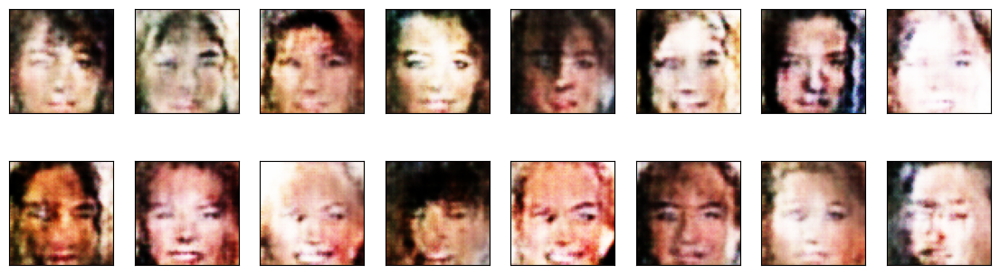

2023-09-09 17:36:26 | Epoch [4/20] | Batch 0/509 | d_loss: 0.4986 | g_loss: 5.8946
2023-09-09 17:36:31 | Epoch [4/20] | Batch 50/509 | d_loss: 0.3529 | g_loss: 1.8863
2023-09-09 17:36:36 | Epoch [4/20] | Batch 100/509 | d_loss: 0.3453 | g_loss: 2.8035
2023-09-09 17:36:41 | Epoch [4/20] | Batch 150/509 | d_loss: 0.6324 | g_loss: 1.7917
2023-09-09 17:36:46 | Epoch [4/20] | Batch 200/509 | d_loss: 0.5098 | g_loss: 3.2850
2023-09-09 17:36:51 | Epoch [4/20] | Batch 250/509 | d_loss: 0.3938 | g_loss: 4.9056
2023-09-09 17:36:56 | Epoch [4/20] | Batch 300/509 | d_loss: 2.3171 | g_loss: 9.1458
2023-09-09 17:37:01 | Epoch [4/20] | Batch 350/509 | d_loss: 0.3970 | g_loss: 2.9485
2023-09-09 17:37:05 | Epoch [4/20] | Batch 400/509 | d_loss: 0.8854 | g_loss: 5.4970
2023-09-09 17:37:11 | Epoch [4/20] | Batch 450/509 | d_loss: 0.3521 | g_loss: 3.2438
2023-09-09 17:37:16 | Epoch [4/20] | Batch 500/509 | d_loss: 0.2387 | g_loss: 1.9911


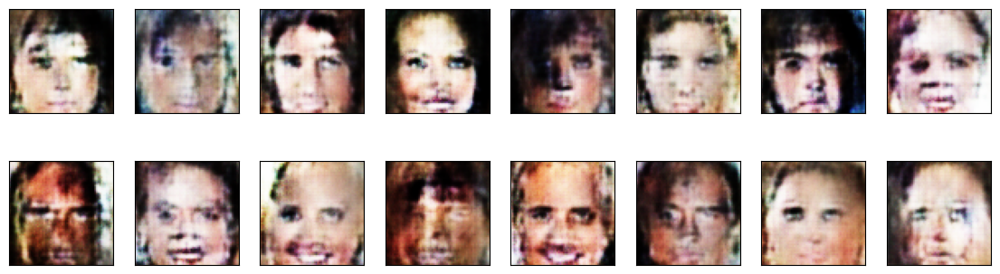

2023-09-09 17:37:18 | Epoch [5/20] | Batch 0/509 | d_loss: 1.0138 | g_loss: 6.3636
2023-09-09 17:37:23 | Epoch [5/20] | Batch 50/509 | d_loss: 0.5408 | g_loss: 2.0309
2023-09-09 17:37:28 | Epoch [5/20] | Batch 100/509 | d_loss: 0.3188 | g_loss: 2.9961
2023-09-09 17:37:32 | Epoch [5/20] | Batch 150/509 | d_loss: 0.2678 | g_loss: 3.8993
2023-09-09 17:37:38 | Epoch [5/20] | Batch 200/509 | d_loss: 0.2437 | g_loss: 2.8571
2023-09-09 17:37:43 | Epoch [5/20] | Batch 250/509 | d_loss: 0.2167 | g_loss: 3.1002
2023-09-09 17:37:47 | Epoch [5/20] | Batch 300/509 | d_loss: 0.2325 | g_loss: 3.2076
2023-09-09 17:37:53 | Epoch [5/20] | Batch 350/509 | d_loss: 0.2473 | g_loss: 4.4580
2023-09-09 17:37:57 | Epoch [5/20] | Batch 400/509 | d_loss: 0.3697 | g_loss: 3.6948
2023-09-09 17:38:02 | Epoch [5/20] | Batch 450/509 | d_loss: 0.1350 | g_loss: 4.9269
2023-09-09 17:38:08 | Epoch [5/20] | Batch 500/509 | d_loss: 0.6605 | g_loss: 6.7640


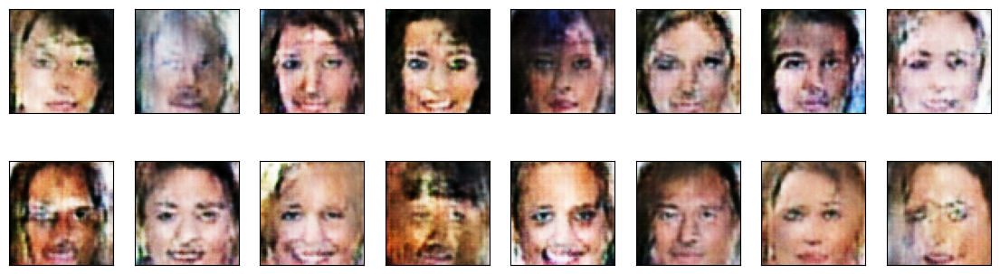

2023-09-09 17:38:10 | Epoch [6/20] | Batch 0/509 | d_loss: 1.2085 | g_loss: 7.7926
2023-09-09 17:38:14 | Epoch [6/20] | Batch 50/509 | d_loss: 0.2472 | g_loss: 5.6478
2023-09-09 17:38:20 | Epoch [6/20] | Batch 100/509 | d_loss: 0.2186 | g_loss: 4.4574
2023-09-09 17:38:24 | Epoch [6/20] | Batch 150/509 | d_loss: 0.7405 | g_loss: 3.7569
2023-09-09 17:38:29 | Epoch [6/20] | Batch 200/509 | d_loss: 0.5721 | g_loss: 1.8727
2023-09-09 17:38:35 | Epoch [6/20] | Batch 250/509 | d_loss: 0.2635 | g_loss: 6.5274
2023-09-09 17:38:39 | Epoch [6/20] | Batch 300/509 | d_loss: 0.2868 | g_loss: 3.5020
2023-09-09 17:38:44 | Epoch [6/20] | Batch 350/509 | d_loss: 0.4278 | g_loss: 4.7585
2023-09-09 17:38:50 | Epoch [6/20] | Batch 400/509 | d_loss: 0.1508 | g_loss: 4.5788
2023-09-09 17:38:54 | Epoch [6/20] | Batch 450/509 | d_loss: 0.2625 | g_loss: 3.2935
2023-09-09 17:38:58 | Epoch [6/20] | Batch 500/509 | d_loss: 0.4413 | g_loss: 7.1503


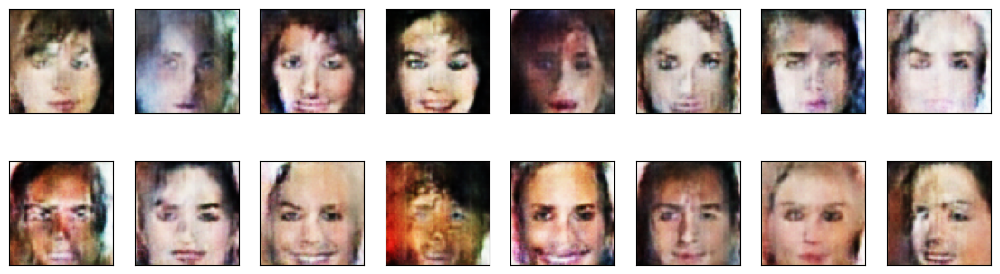

2023-09-09 17:39:01 | Epoch [7/20] | Batch 0/509 | d_loss: 0.5253 | g_loss: 2.1503
2023-09-09 17:39:06 | Epoch [7/20] | Batch 50/509 | d_loss: 0.1116 | g_loss: 4.3921
2023-09-09 17:39:10 | Epoch [7/20] | Batch 100/509 | d_loss: 0.2033 | g_loss: 2.6964
2023-09-09 17:39:15 | Epoch [7/20] | Batch 150/509 | d_loss: 0.1712 | g_loss: 3.0567
2023-09-09 17:39:20 | Epoch [7/20] | Batch 200/509 | d_loss: 0.5085 | g_loss: 3.9865
2023-09-09 17:39:25 | Epoch [7/20] | Batch 250/509 | d_loss: 0.1878 | g_loss: 4.3246
2023-09-09 17:39:30 | Epoch [7/20] | Batch 300/509 | d_loss: 0.3339 | g_loss: 3.2726
2023-09-09 17:39:35 | Epoch [7/20] | Batch 350/509 | d_loss: 0.4397 | g_loss: 4.4916
2023-09-09 17:39:40 | Epoch [7/20] | Batch 400/509 | d_loss: 0.2004 | g_loss: 4.0416
2023-09-09 17:39:45 | Epoch [7/20] | Batch 450/509 | d_loss: 0.1775 | g_loss: 5.5255
2023-09-09 17:39:50 | Epoch [7/20] | Batch 500/509 | d_loss: 0.3399 | g_loss: 4.5404


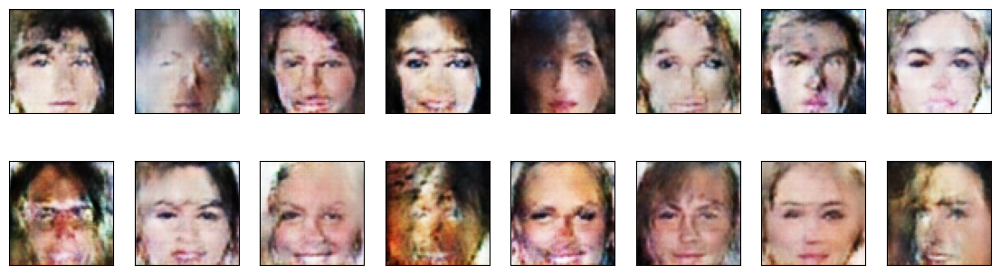

2023-09-09 17:39:52 | Epoch [8/20] | Batch 0/509 | d_loss: 0.3910 | g_loss: 3.3661
2023-09-09 17:39:57 | Epoch [8/20] | Batch 50/509 | d_loss: 0.2404 | g_loss: 4.5128
2023-09-09 17:40:02 | Epoch [8/20] | Batch 100/509 | d_loss: 0.7888 | g_loss: 3.3679
2023-09-09 17:40:07 | Epoch [8/20] | Batch 150/509 | d_loss: 0.2925 | g_loss: 5.1618
2023-09-09 17:40:12 | Epoch [8/20] | Batch 200/509 | d_loss: 0.3103 | g_loss: 3.7598
2023-09-09 17:40:17 | Epoch [8/20] | Batch 250/509 | d_loss: 1.0844 | g_loss: 4.1411
2023-09-09 17:40:21 | Epoch [8/20] | Batch 300/509 | d_loss: 0.0784 | g_loss: 4.9118
2023-09-09 17:40:27 | Epoch [8/20] | Batch 350/509 | d_loss: 0.5040 | g_loss: 6.5210
2023-09-09 17:40:32 | Epoch [8/20] | Batch 400/509 | d_loss: 1.4465 | g_loss: 3.3264
2023-09-09 17:40:36 | Epoch [8/20] | Batch 450/509 | d_loss: 0.2332 | g_loss: 2.6738
2023-09-09 17:40:42 | Epoch [8/20] | Batch 500/509 | d_loss: 2.4391 | g_loss: 14.2456


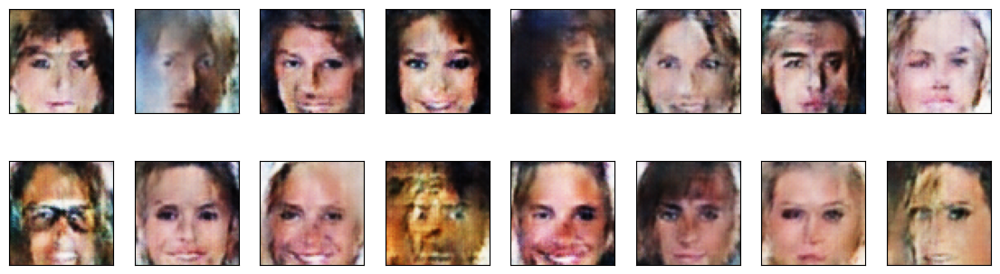

2023-09-09 17:40:44 | Epoch [9/20] | Batch 0/509 | d_loss: 0.6867 | g_loss: 5.3332
2023-09-09 17:40:48 | Epoch [9/20] | Batch 50/509 | d_loss: 0.6123 | g_loss: 1.6063
2023-09-09 17:40:53 | Epoch [9/20] | Batch 100/509 | d_loss: 0.2331 | g_loss: 4.4234
2023-09-09 17:40:58 | Epoch [9/20] | Batch 150/509 | d_loss: 2.0263 | g_loss: 2.5324
2023-09-09 17:41:03 | Epoch [9/20] | Batch 200/509 | d_loss: 0.2196 | g_loss: 1.8456
2023-09-09 17:41:08 | Epoch [9/20] | Batch 250/509 | d_loss: 0.1158 | g_loss: 4.0049
2023-09-09 17:41:13 | Epoch [9/20] | Batch 300/509 | d_loss: 0.1918 | g_loss: 5.3100
2023-09-09 17:41:18 | Epoch [9/20] | Batch 350/509 | d_loss: 0.3780 | g_loss: 4.8999
2023-09-09 17:41:23 | Epoch [9/20] | Batch 400/509 | d_loss: 0.1669 | g_loss: 6.0572
2023-09-09 17:41:28 | Epoch [9/20] | Batch 450/509 | d_loss: 0.4142 | g_loss: 4.0497
2023-09-09 17:41:32 | Epoch [9/20] | Batch 500/509 | d_loss: 1.4631 | g_loss: 2.7355


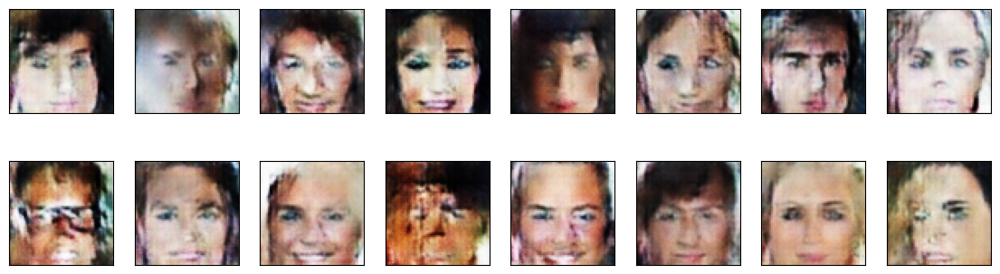

2023-09-09 17:41:34 | Epoch [10/20] | Batch 0/509 | d_loss: 0.4635 | g_loss: 2.2493
2023-09-09 17:41:40 | Epoch [10/20] | Batch 50/509 | d_loss: 0.2115 | g_loss: 3.0145
2023-09-09 17:41:45 | Epoch [10/20] | Batch 100/509 | d_loss: 0.0789 | g_loss: 3.4262
2023-09-09 17:41:50 | Epoch [10/20] | Batch 150/509 | d_loss: 0.1885 | g_loss: 4.9777
2023-09-09 17:41:55 | Epoch [10/20] | Batch 200/509 | d_loss: 0.0463 | g_loss: 5.1322
2023-09-09 17:41:59 | Epoch [10/20] | Batch 250/509 | d_loss: 0.1479 | g_loss: 4.3851
2023-09-09 17:42:04 | Epoch [10/20] | Batch 300/509 | d_loss: 0.1262 | g_loss: 3.7947
2023-09-09 17:42:10 | Epoch [10/20] | Batch 350/509 | d_loss: 0.2676 | g_loss: 5.9799
2023-09-09 17:42:14 | Epoch [10/20] | Batch 400/509 | d_loss: 0.2912 | g_loss: 3.1009
2023-09-09 17:42:19 | Epoch [10/20] | Batch 450/509 | d_loss: 0.5984 | g_loss: 8.2312
2023-09-09 17:42:24 | Epoch [10/20] | Batch 500/509 | d_loss: 0.2119 | g_loss: 3.4212


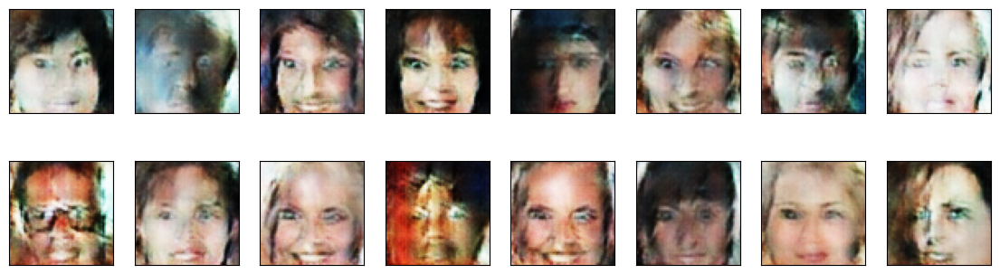

2023-09-09 17:42:26 | Epoch [11/20] | Batch 0/509 | d_loss: 0.3449 | g_loss: 5.8372
2023-09-09 17:42:30 | Epoch [11/20] | Batch 50/509 | d_loss: 0.1437 | g_loss: 3.7172
2023-09-09 17:42:36 | Epoch [11/20] | Batch 100/509 | d_loss: 0.1622 | g_loss: 4.6068
2023-09-09 17:42:41 | Epoch [11/20] | Batch 150/509 | d_loss: 0.0923 | g_loss: 3.8791
2023-09-09 17:42:45 | Epoch [11/20] | Batch 200/509 | d_loss: 0.2166 | g_loss: 4.5569
2023-09-09 17:42:51 | Epoch [11/20] | Batch 250/509 | d_loss: 0.1997 | g_loss: 4.2116
2023-09-09 17:42:55 | Epoch [11/20] | Batch 300/509 | d_loss: 0.3250 | g_loss: 2.5131
2023-09-09 17:43:00 | Epoch [11/20] | Batch 350/509 | d_loss: 0.1786 | g_loss: 3.8134
2023-09-09 17:43:05 | Epoch [11/20] | Batch 400/509 | d_loss: 0.1062 | g_loss: 3.6561
2023-09-09 17:43:10 | Epoch [11/20] | Batch 450/509 | d_loss: 0.1674 | g_loss: 5.5474
2023-09-09 17:43:15 | Epoch [11/20] | Batch 500/509 | d_loss: 1.1158 | g_loss: 12.4734


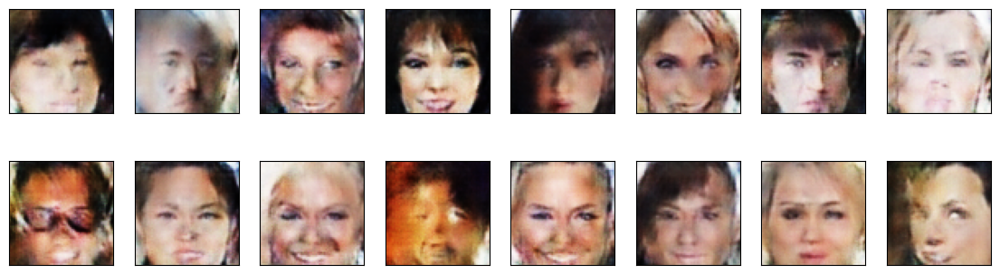

2023-09-09 17:43:17 | Epoch [12/20] | Batch 0/509 | d_loss: 0.8158 | g_loss: 5.4491
2023-09-09 17:43:22 | Epoch [12/20] | Batch 50/509 | d_loss: 0.2797 | g_loss: 5.8006
2023-09-09 17:43:26 | Epoch [12/20] | Batch 100/509 | d_loss: 1.7869 | g_loss: 12.8154
2023-09-09 17:43:32 | Epoch [12/20] | Batch 150/509 | d_loss: 0.5218 | g_loss: 2.3404
2023-09-09 17:43:36 | Epoch [12/20] | Batch 200/509 | d_loss: 0.1720 | g_loss: 3.9915
2023-09-09 17:43:41 | Epoch [12/20] | Batch 250/509 | d_loss: 0.1043 | g_loss: 4.0221
2023-09-09 17:43:47 | Epoch [12/20] | Batch 300/509 | d_loss: 0.1305 | g_loss: 3.6730
2023-09-09 17:43:51 | Epoch [12/20] | Batch 350/509 | d_loss: 0.0915 | g_loss: 4.8596
2023-09-09 17:43:56 | Epoch [12/20] | Batch 400/509 | d_loss: 0.3292 | g_loss: 7.0832
2023-09-09 17:44:01 | Epoch [12/20] | Batch 450/509 | d_loss: 0.1363 | g_loss: 4.6894
2023-09-09 17:44:06 | Epoch [12/20] | Batch 500/509 | d_loss: 0.6075 | g_loss: 1.1786


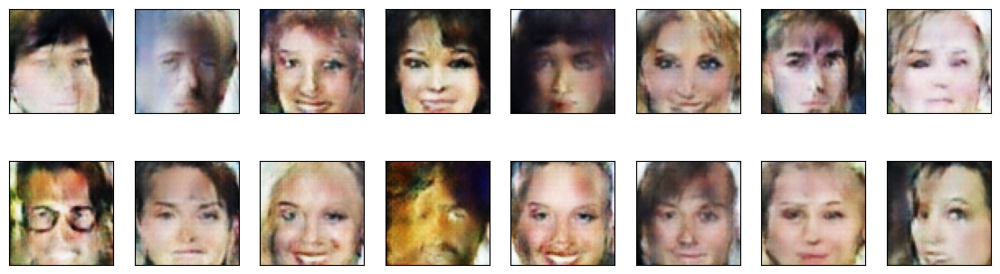

2023-09-09 17:44:08 | Epoch [13/20] | Batch 0/509 | d_loss: 0.4776 | g_loss: 3.0358
2023-09-09 17:44:13 | Epoch [13/20] | Batch 50/509 | d_loss: 0.4150 | g_loss: 7.3613
2023-09-09 17:44:18 | Epoch [13/20] | Batch 100/509 | d_loss: 0.1731 | g_loss: 2.9839
2023-09-09 17:44:22 | Epoch [13/20] | Batch 150/509 | d_loss: 1.8426 | g_loss: 9.6558
2023-09-09 17:44:28 | Epoch [13/20] | Batch 200/509 | d_loss: 0.1921 | g_loss: 3.4296
2023-09-09 17:44:33 | Epoch [13/20] | Batch 250/509 | d_loss: 0.1639 | g_loss: 4.0535
2023-09-09 17:44:37 | Epoch [13/20] | Batch 300/509 | d_loss: 0.2244 | g_loss: 1.5625
2023-09-09 17:44:43 | Epoch [13/20] | Batch 350/509 | d_loss: 0.0988 | g_loss: 7.3121
2023-09-09 17:44:47 | Epoch [13/20] | Batch 400/509 | d_loss: 0.1245 | g_loss: 5.4999
2023-09-09 17:44:52 | Epoch [13/20] | Batch 450/509 | d_loss: 0.1540 | g_loss: 4.8242
2023-09-09 17:44:57 | Epoch [13/20] | Batch 500/509 | d_loss: 0.2493 | g_loss: 4.9785


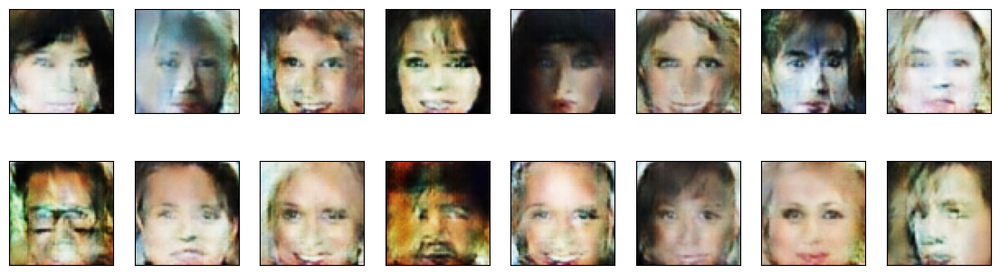

2023-09-09 17:44:59 | Epoch [14/20] | Batch 0/509 | d_loss: 0.3244 | g_loss: 2.2075
2023-09-09 17:45:04 | Epoch [14/20] | Batch 50/509 | d_loss: 0.1966 | g_loss: 3.5413
2023-09-09 17:45:09 | Epoch [14/20] | Batch 100/509 | d_loss: 0.1339 | g_loss: 5.2895
2023-09-09 17:45:14 | Epoch [14/20] | Batch 150/509 | d_loss: 0.7999 | g_loss: 6.5033
2023-09-09 17:45:18 | Epoch [14/20] | Batch 200/509 | d_loss: 0.1504 | g_loss: 3.8587
2023-09-09 17:45:24 | Epoch [14/20] | Batch 250/509 | d_loss: 0.1535 | g_loss: 3.4403
2023-09-09 17:45:29 | Epoch [14/20] | Batch 300/509 | d_loss: 0.1928 | g_loss: 3.5385
2023-09-09 17:45:33 | Epoch [14/20] | Batch 350/509 | d_loss: 0.0897 | g_loss: 4.9065
2023-09-09 17:45:39 | Epoch [14/20] | Batch 400/509 | d_loss: 0.2109 | g_loss: 4.5798
2023-09-09 17:45:43 | Epoch [14/20] | Batch 450/509 | d_loss: 0.3102 | g_loss: 5.4816
2023-09-09 17:45:48 | Epoch [14/20] | Batch 500/509 | d_loss: 0.2118 | g_loss: 3.8448


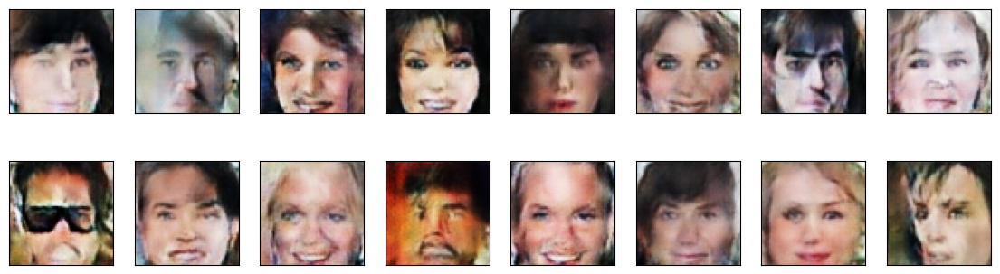

2023-09-09 17:45:50 | Epoch [15/20] | Batch 0/509 | d_loss: 0.1615 | g_loss: 3.1397
2023-09-09 17:45:56 | Epoch [15/20] | Batch 50/509 | d_loss: 0.1397 | g_loss: 5.2315
2023-09-09 17:46:00 | Epoch [15/20] | Batch 100/509 | d_loss: 0.0316 | g_loss: 4.7861
2023-09-09 17:46:05 | Epoch [15/20] | Batch 150/509 | d_loss: 0.0684 | g_loss: 3.9772
2023-09-09 17:46:10 | Epoch [15/20] | Batch 200/509 | d_loss: 0.0859 | g_loss: 4.9701
2023-09-09 17:46:15 | Epoch [15/20] | Batch 250/509 | d_loss: 0.1006 | g_loss: 3.5224
2023-09-09 17:46:20 | Epoch [15/20] | Batch 300/509 | d_loss: 0.1533 | g_loss: 3.1695
2023-09-09 17:46:25 | Epoch [15/20] | Batch 350/509 | d_loss: 0.6637 | g_loss: 1.5688
2023-09-09 17:46:29 | Epoch [15/20] | Batch 400/509 | d_loss: 0.2122 | g_loss: 4.2738
2023-09-09 17:46:35 | Epoch [15/20] | Batch 450/509 | d_loss: 0.2198 | g_loss: 5.9767
2023-09-09 17:46:40 | Epoch [15/20] | Batch 500/509 | d_loss: 0.0707 | g_loss: 6.9468


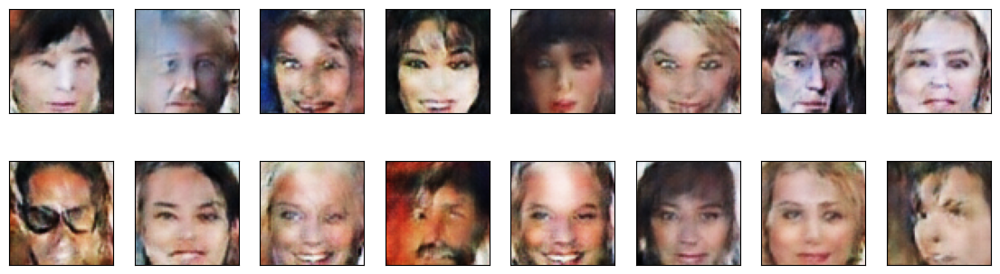

2023-09-09 17:46:42 | Epoch [16/20] | Batch 0/509 | d_loss: 0.1210 | g_loss: 5.0475
2023-09-09 17:46:46 | Epoch [16/20] | Batch 50/509 | d_loss: 0.0474 | g_loss: 9.5170
2023-09-09 17:46:52 | Epoch [16/20] | Batch 100/509 | d_loss: 1.0291 | g_loss: 10.7216
2023-09-09 17:46:56 | Epoch [16/20] | Batch 150/509 | d_loss: 0.1553 | g_loss: 4.0337
2023-09-09 17:47:01 | Epoch [16/20] | Batch 200/509 | d_loss: 0.9729 | g_loss: 8.2011
2023-09-09 17:47:07 | Epoch [16/20] | Batch 250/509 | d_loss: 0.1361 | g_loss: 7.4369
2023-09-09 17:47:11 | Epoch [16/20] | Batch 300/509 | d_loss: 0.2010 | g_loss: 4.1516
2023-09-09 17:47:16 | Epoch [16/20] | Batch 350/509 | d_loss: 0.1361 | g_loss: 3.8199
2023-09-09 17:47:21 | Epoch [16/20] | Batch 400/509 | d_loss: 0.2846 | g_loss: 2.1589
2023-09-09 17:47:26 | Epoch [16/20] | Batch 450/509 | d_loss: 0.2860 | g_loss: 2.1369
2023-09-09 17:47:32 | Epoch [16/20] | Batch 500/509 | d_loss: 0.6680 | g_loss: 4.7659


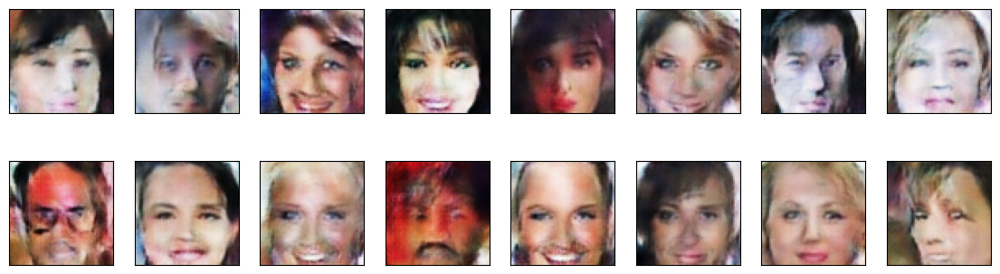

2023-09-09 17:47:33 | Epoch [17/20] | Batch 0/509 | d_loss: 0.1406 | g_loss: 3.6082
2023-09-09 17:47:38 | Epoch [17/20] | Batch 50/509 | d_loss: 0.1402 | g_loss: 4.4767
2023-09-09 17:47:42 | Epoch [17/20] | Batch 100/509 | d_loss: 0.3411 | g_loss: 1.0618
2023-09-09 17:47:48 | Epoch [17/20] | Batch 150/509 | d_loss: 0.0882 | g_loss: 4.5268
2023-09-09 17:47:52 | Epoch [17/20] | Batch 200/509 | d_loss: 0.1284 | g_loss: 5.2845
2023-09-09 17:47:58 | Epoch [17/20] | Batch 250/509 | d_loss: 0.0668 | g_loss: 6.3063
2023-09-09 17:48:03 | Epoch [17/20] | Batch 300/509 | d_loss: 0.0909 | g_loss: 5.9305
2023-09-09 17:48:07 | Epoch [17/20] | Batch 350/509 | d_loss: 0.0693 | g_loss: 8.1527
2023-09-09 17:48:13 | Epoch [17/20] | Batch 400/509 | d_loss: 0.1303 | g_loss: 4.5416
2023-09-09 17:48:17 | Epoch [17/20] | Batch 450/509 | d_loss: 0.2555 | g_loss: 4.0730
2023-09-09 17:48:22 | Epoch [17/20] | Batch 500/509 | d_loss: 0.2342 | g_loss: 4.9629


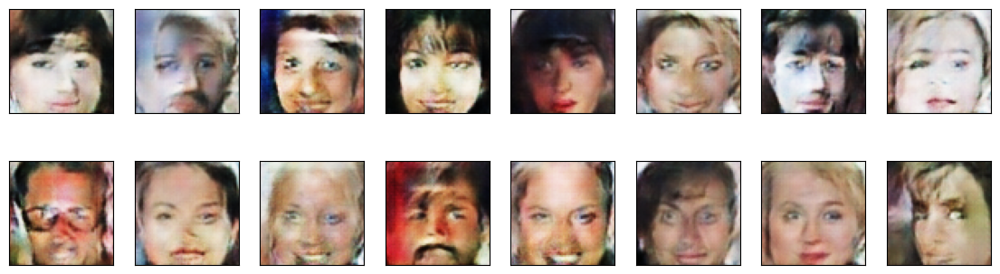

2023-09-09 17:48:24 | Epoch [18/20] | Batch 0/509 | d_loss: 0.1786 | g_loss: 4.1235
2023-09-09 17:48:30 | Epoch [18/20] | Batch 50/509 | d_loss: 1.7050 | g_loss: 16.9985
2023-09-09 17:48:34 | Epoch [18/20] | Batch 100/509 | d_loss: 0.3524 | g_loss: 2.4447
2023-09-09 17:48:39 | Epoch [18/20] | Batch 150/509 | d_loss: 0.2347 | g_loss: 4.1839
2023-09-09 17:48:45 | Epoch [18/20] | Batch 200/509 | d_loss: 0.0663 | g_loss: 6.1658
2023-09-09 17:48:49 | Epoch [18/20] | Batch 250/509 | d_loss: 0.1451 | g_loss: 3.3033
2023-09-09 17:48:54 | Epoch [18/20] | Batch 300/509 | d_loss: 0.0219 | g_loss: 5.1044
2023-09-09 17:49:00 | Epoch [18/20] | Batch 350/509 | d_loss: 0.1153 | g_loss: 5.2175
2023-09-09 17:49:04 | Epoch [18/20] | Batch 400/509 | d_loss: 0.1301 | g_loss: 4.3495
2023-09-09 17:49:09 | Epoch [18/20] | Batch 450/509 | d_loss: 0.7385 | g_loss: 3.8835
2023-09-09 17:49:14 | Epoch [18/20] | Batch 500/509 | d_loss: 0.1081 | g_loss: 6.0807


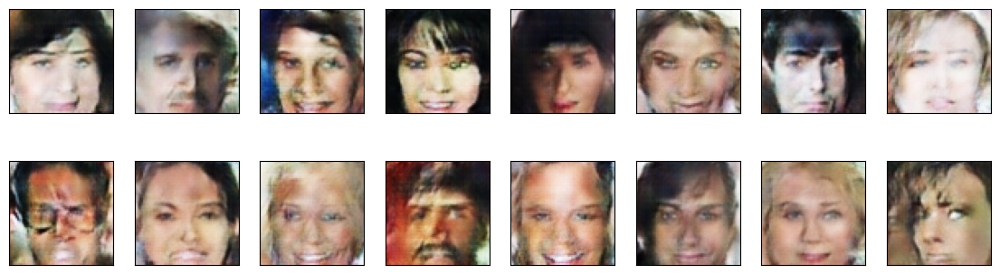

2023-09-09 17:49:16 | Epoch [19/20] | Batch 0/509 | d_loss: 0.1846 | g_loss: 4.4451
2023-09-09 17:49:20 | Epoch [19/20] | Batch 50/509 | d_loss: 0.2402 | g_loss: 3.4690
2023-09-09 17:49:27 | Epoch [19/20] | Batch 100/509 | d_loss: 0.2273 | g_loss: 3.3642
2023-09-09 17:49:31 | Epoch [19/20] | Batch 150/509 | d_loss: 0.1785 | g_loss: 5.2140
2023-09-09 17:49:36 | Epoch [19/20] | Batch 200/509 | d_loss: 0.1276 | g_loss: 3.1597
2023-09-09 17:49:41 | Epoch [19/20] | Batch 250/509 | d_loss: 0.1706 | g_loss: 4.0444
2023-09-09 17:49:46 | Epoch [19/20] | Batch 300/509 | d_loss: 0.2896 | g_loss: 3.5900
2023-09-09 17:49:51 | Epoch [19/20] | Batch 350/509 | d_loss: 0.1059 | g_loss: 5.0460
2023-09-09 17:49:56 | Epoch [19/20] | Batch 400/509 | d_loss: 0.1200 | g_loss: 5.2587
2023-09-09 17:50:01 | Epoch [19/20] | Batch 450/509 | d_loss: 0.3673 | g_loss: 4.8168
2023-09-09 17:50:06 | Epoch [19/20] | Batch 500/509 | d_loss: 0.6928 | g_loss: 5.0612


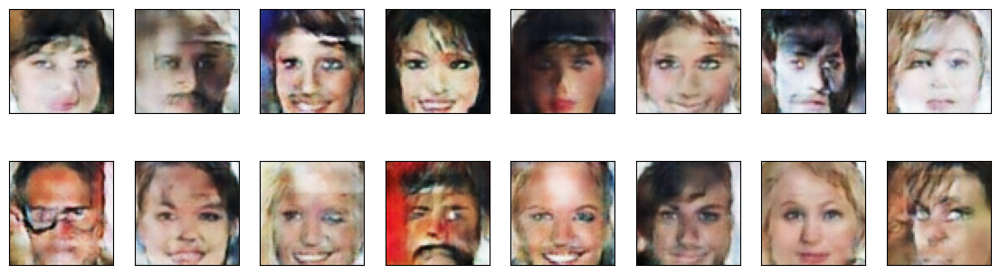

2023-09-09 17:50:08 | Epoch [20/20] | Batch 0/509 | d_loss: 0.1344 | g_loss: 4.9665
2023-09-09 17:50:13 | Epoch [20/20] | Batch 50/509 | d_loss: 0.0824 | g_loss: 6.8940
2023-09-09 17:50:17 | Epoch [20/20] | Batch 100/509 | d_loss: 0.0699 | g_loss: 5.0269
2023-09-09 17:50:23 | Epoch [20/20] | Batch 150/509 | d_loss: 0.2564 | g_loss: 4.5382
2023-09-09 17:50:28 | Epoch [20/20] | Batch 200/509 | d_loss: 0.2191 | g_loss: 4.8975
2023-09-09 17:50:32 | Epoch [20/20] | Batch 250/509 | d_loss: 0.0151 | g_loss: 6.2832
2023-09-09 17:50:38 | Epoch [20/20] | Batch 300/509 | d_loss: 0.1197 | g_loss: 4.2390
2023-09-09 17:50:42 | Epoch [20/20] | Batch 350/509 | d_loss: 0.0123 | g_loss: 8.0627
2023-09-09 17:50:47 | Epoch [20/20] | Batch 400/509 | d_loss: 0.5718 | g_loss: 9.8149
2023-09-09 17:50:53 | Epoch [20/20] | Batch 450/509 | d_loss: 0.1374 | g_loss: 6.3286
2023-09-09 17:50:57 | Epoch [20/20] | Batch 500/509 | d_loss: 0.2064 | g_loss: 5.8685


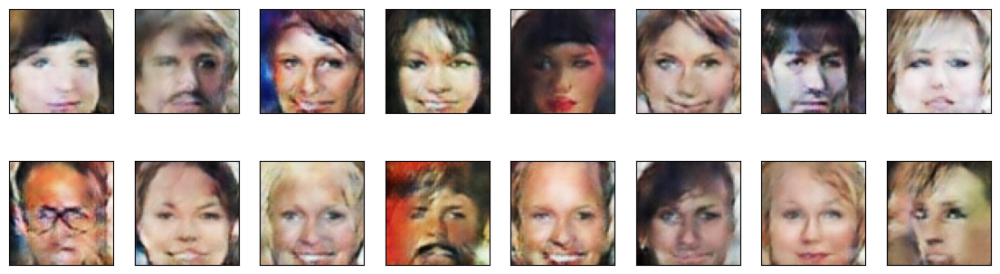

In [33]:
fixed_latent_vector = torch.randn(16, latent_dim, 1, 1).float().cuda()
losses = []

for epoch in range(n_epochs):
    for batch_i, real_images in enumerate(dataloader):
        real_images = real_images.to(device)

        ####################################

        # TODO: implement the training strategy

        ####################################
        batch_size = real_images.size(0)

        d_loss= discriminator_step(batch_size, latent_dim, real_images)
        g_loss= generator_step(batch_size, latent_dim)

        if batch_i % print_every == 0:
            # append discriminator loss and generator loss
            d = d_loss['loss'].item()
            g = g_loss['loss'].item()
            losses.append((d, g))
            # print discriminator and generator loss
            time = str(datetime.now()).split('.')[0]
            print(f'{time} | Epoch [{epoch+1}/{n_epochs}] | Batch {batch_i}/{len(dataloader)} | d_loss: {d:.4f} | g_loss: {g:.4f}')

    # display images during training
    generator.eval()
    generated_images = generator(fixed_latent_vector)
    display(generated_images)
    generator.train()

### Training losses

Plot the training losses for the generator and discriminator.

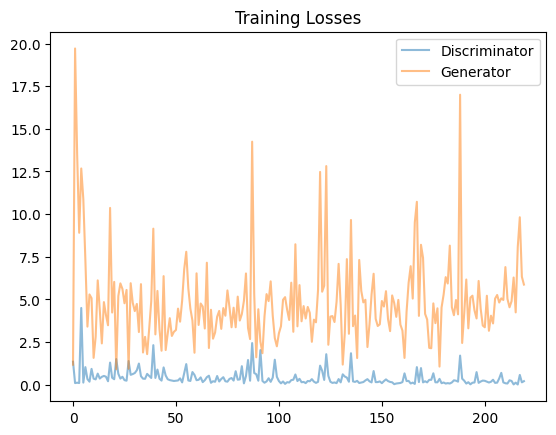

In [34]:
"""
DO NOT MODIFY ANYTHING IN THIS CELL
"""
fig, ax = plt.subplots()
losses = np.array(losses)
plt.plot(losses.T[0], label='Discriminator', alpha=0.5)
plt.plot(losses.T[1], label='Generator', alpha=0.5)
plt.title("Training Losses")
plt.legend()

### Question: What do you notice about your generated samples and how might you improve this model?
When you answer this question, consider the following factors:
* The dataset is biased; it is made of "celebrity" faces that are mostly white
* Model size; larger models have the opportunity to learn more features in a data feature space
* Optimization strategy; optimizers and number of epochs affect your final result
* Loss functions

**Answer:** (Write your answer in this cell)

*   The images have recognized features of the human face like nose, eyes, and mouth.
*   The image's color looks mixed by multiple colors which lead to making it hazy, it means when we select the dataset based on the skin color or sex, the hair will affect the human face.
* The problem with the dataset is there is the chin of the human doesn't appear, so may not predict the gender of the human in the image.
* I started with 20 epochs, I checked the loss function and got a good result.
* I will get better result if I increase the number of epochs.


### Submitting This Project
When submitting this project, make sure to run all the cells before saving the notebook. Save the notebook file as "dlnd_face_generation.ipynb".  

Submit the notebook using the ***SUBMIT*** button in the bottom right corner of the Project Workspace.